# Rainfall Weather Forecasting

# Project Description

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

# 1. Problem Statement:

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
    
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

# Dataset Description:

Number of columns: 23

Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

# Dataset Link

•	https://github.com/dsrscientist/dataset3/blob/main/weatherAUS.csv

# Import the needed libraries for data preprocessing, model selection, model building and evaluation

In [12]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import sklearn
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier,ExtraTreesClassifier
from scipy.stats import zscore,boxcox
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import FactorAnalysis
from sklearn.feature_selection import chi2
from scipy.stats import chi2_contingency
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,classification_report,auc,roc_curve,roc_auc_score,r2_score

# Read the dataset and print first ten records using pandas head method

In [15]:
rainfalldf=pd.read_csv(r'C:\Users\KIRUTHIKA\OneDrive\Documents\PG Program in Data Science Machine Learning and Neural Network\Internship\Datasets\weatherAUS.csv')
rainfalldf.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# Get the information about the dataset using pandas info method

In [18]:
rainfalldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

The output from the pandas info method provides the following information that:

1. The dataset contains 8425 records and 23 features.

2. There are null records present in the dataset.

3. The dataset contains the mixed type of data i.e the dataset contains both object and float64 types of data.

# Get the total rows and columns in the dataset using pandas shape method

In [22]:
rainfalldf.shape

(8425, 23)

The output from pandas shape methods shows that there are 8425 rows and 23 columns in the dataset

# Check for the null records present in the dataset using pandas isnull method

In [26]:
rainfalldf.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

The output from the pandas isnull method shows that there are null rcords present for all the columns except for the Date and Location columns in the dataset. 

# SimpleImputer to remove null records in the dataset

In [30]:
columns_to_impute=['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm']
si=SimpleImputer()
rainfalldf[columns_to_impute]=si.fit_transform(rainfalldf[columns_to_impute])

In [32]:
columns_to_impute_null=['WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']
si1=SimpleImputer(strategy='most_frequent')
rainfalldf[columns_to_impute_null]=si1.fit_transform(rainfalldf[columns_to_impute_null])

In [34]:
rainfalldf.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

# Check for the duplicate records present in the dataset using pandas duplicated method

In [37]:
rainfalldf.duplicated().sum()

1663

There are 1663 duplicate records present in the dataset.

# Display the duplicate records in the dataset

In [41]:
rainfalldf[rainfalldf.duplicated()]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3674,2015-10-20,Williamtown,13.1,31.6,0.000000,6.400000,11.100000,E,33.0,N,...,67.0,37.0,1021.4,1016.4,1.000000,1.000000,21.5,30.3,No,No
3675,2015-10-21,Williamtown,16.6,34.1,0.000000,6.600000,9.900000,NNW,44.0,NW,...,54.0,39.0,1014.7,1010.6,1.000000,5.000000,24.7,30.2,No,Yes
3676,2015-10-22,Williamtown,17.5,26.3,19.800000,7.800000,7.632205,SW,67.0,N,...,94.0,45.0,1012.4,1008.3,8.000000,6.000000,18.6,25.6,Yes,No
3677,2015-10-23,Williamtown,14.7,21.4,2.805913,5.389395,7.632205,S,59.0,WSW,...,90.0,48.0,1021.4,1020.9,7.000000,5.000000,15.6,20.3,No,No
3678,2015-10-24,Williamtown,11.0,22.5,2.805913,5.389395,7.632205,E,35.0,NW,...,65.0,60.0,1024.5,1021.4,4.566622,4.503183,18.4,21.4,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6143,2012-01-25,Melbourne,20.3,25.0,0.000000,11.600000,7.300000,S,39.0,S,...,77.0,60.0,1015.2,1014.0,8.000000,2.000000,20.8,23.8,No,No
6144,2012-01-26,Melbourne,16.1,24.5,0.000000,4.400000,12.400000,S,50.0,S,...,67.0,55.0,1018.5,1016.9,4.566622,4.503183,18.9,23.7,No,No
6145,2012-01-27,Melbourne,16.6,30.7,2.805913,8.000000,13.000000,SSE,39.0,WSW,...,69.0,55.0,1016.9,1013.5,4.566622,4.503183,20.5,26.3,No,No
6146,2012-01-28,Melbourne,20.0,30.4,2.805913,8.200000,12.100000,SSE,37.0,SW,...,64.0,55.0,1012.7,1009.2,4.566622,4.503183,24.1,27.4,No,No


# Remove duplicate records in the dataset using pandas drop duplicates method

In [44]:
rainfalldf=rainfalldf.drop_duplicates()

In [46]:
rainfalldf.duplicated().sum()

0

In [48]:
rainfalldf.shape

(6762, 23)

# Display the statistical summary of the dataset using pandas describe method

In [51]:
rainfalldf.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.110016,24.096335,2.780674,5.339977,7.767098,39.144388,12.792133,17.585384,67.509082,50.478258,1017.629004,1015.142442,4.400224,4.372235,17.894035,22.704947
std,5.540673,6.130161,10.482770,3.343991,2.736693,13.382876,9.788112,9.549341,17.182723,18.498573,6.027916,5.967815,2.476781,2.324720,5.722423,5.971925
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.000000,7.632205,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.193305,23.500000,0.000000,5.389395,7.632205,39.000000,11.000000,17.000000,68.000000,50.000000,1017.640233,1015.236075,4.566622,4.503183,17.900000,22.300000
75%,17.400000,28.400000,1.200000,5.389395,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


The outptut from the pandas describe method provides the following information:

1, The count for all the columns are same and there are no null records present in the dataset.

2, The value of mean is higher than the median for the column MaxTemp and there are less amount of skewness present in the dataset.

3, The maximum value is higher than the value of 75th percentile for all the columns in the dataset and there are outliers present in the dataset.

In [54]:
rainfalldf['Location'].unique()

array(['Albury', 'CoffsHarbour', 'Newcastle', 'Penrith', 'Williamtown',
       'Wollongong', 'Melbourne', 'Brisbane', 'Adelaide', 'PerthAirport',
       'Darwin', 'Uluru'], dtype=object)

# Relationship between the columns Location and Minimum temperature for prediction for rain tomorrow using barplot

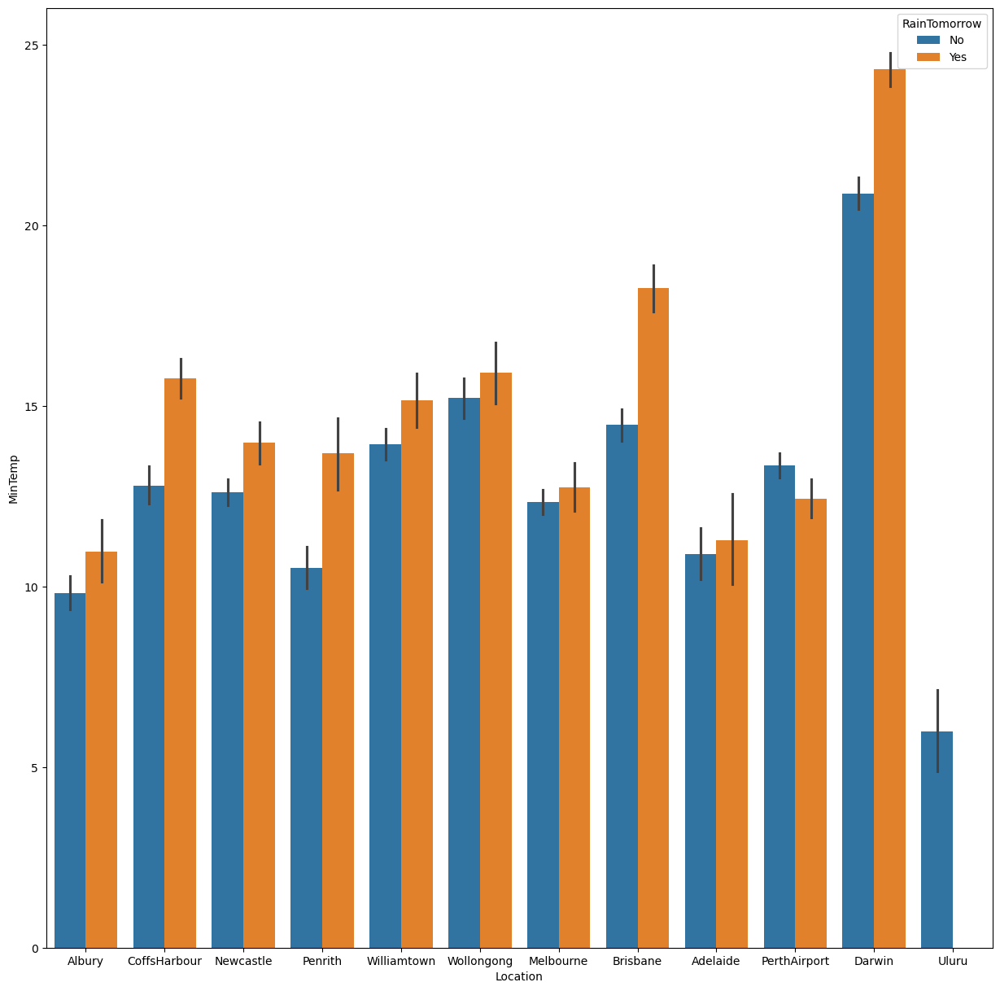

In [57]:
plt.figure(figsize=(15,15))
sns.barplot(rainfalldf,x='Location',y='MinTemp',hue='RainTomorrow',dodge=True)
plt.show()

It is clear from the above output that the Darwin location have higher chance of rain tomorrow compared to other locations in the dataset.

# Relationship between the columns Location and Maximum temperature for prediction for rain tomorrow using barplot

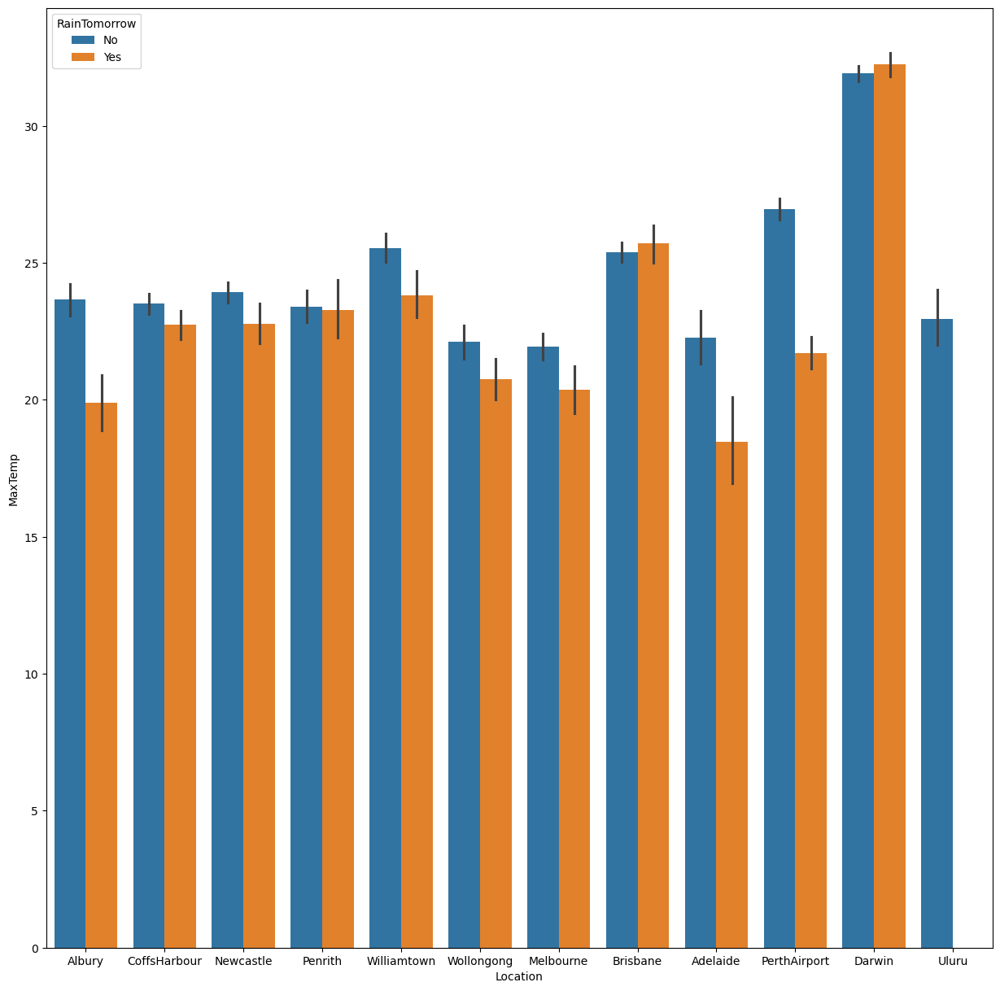

In [61]:
plt.figure(figsize=(15,15))
sns.barplot(rainfalldf,x='Location',y='MaxTemp',hue='RainTomorrow',dodge=True)
plt.show()

In [63]:
# Relationship between the columns Location and Rainfall for prediction for rain tomorrow using barplot

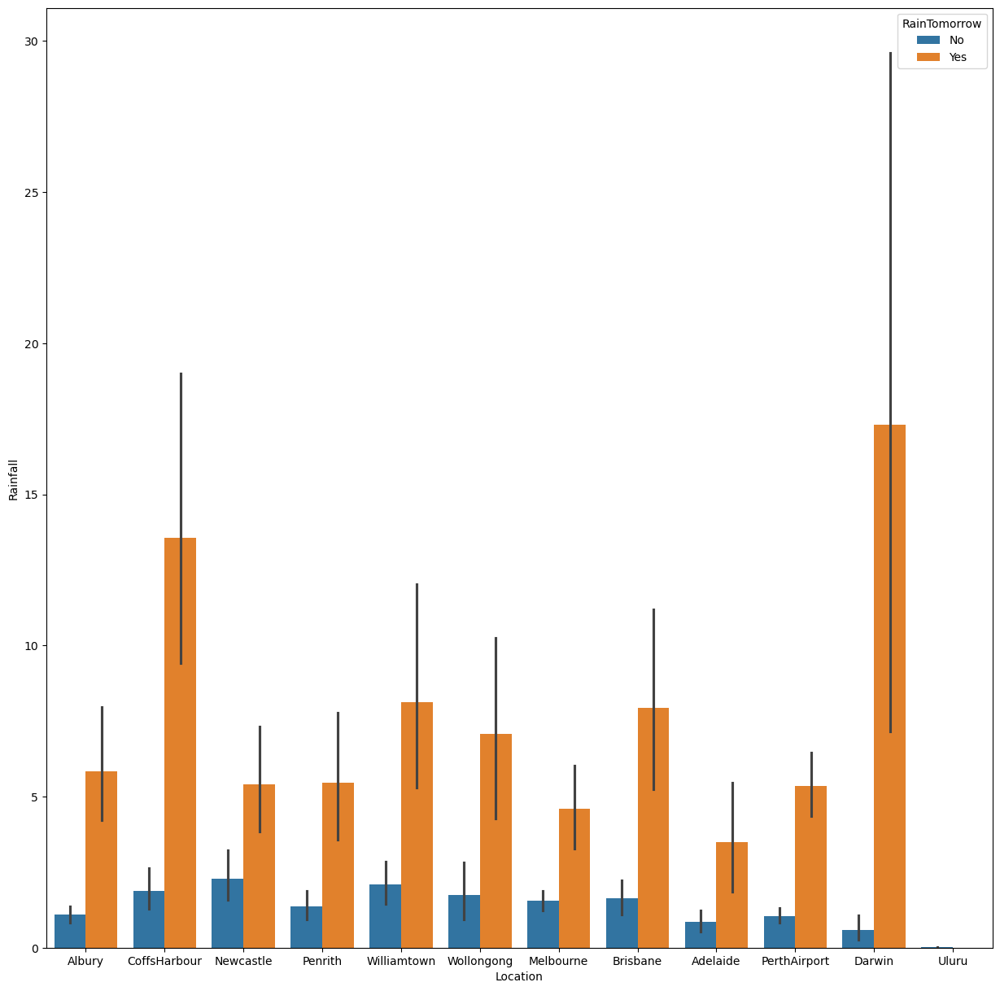

In [65]:
plt.figure(figsize=(15,15))
sns.barplot(rainfalldf,x='Location',y='Rainfall',hue='RainTomorrow',dodge=True)
plt.show()

# Relationship between the columns Location and Evaporation for prediction for rain tomorrow using barplot

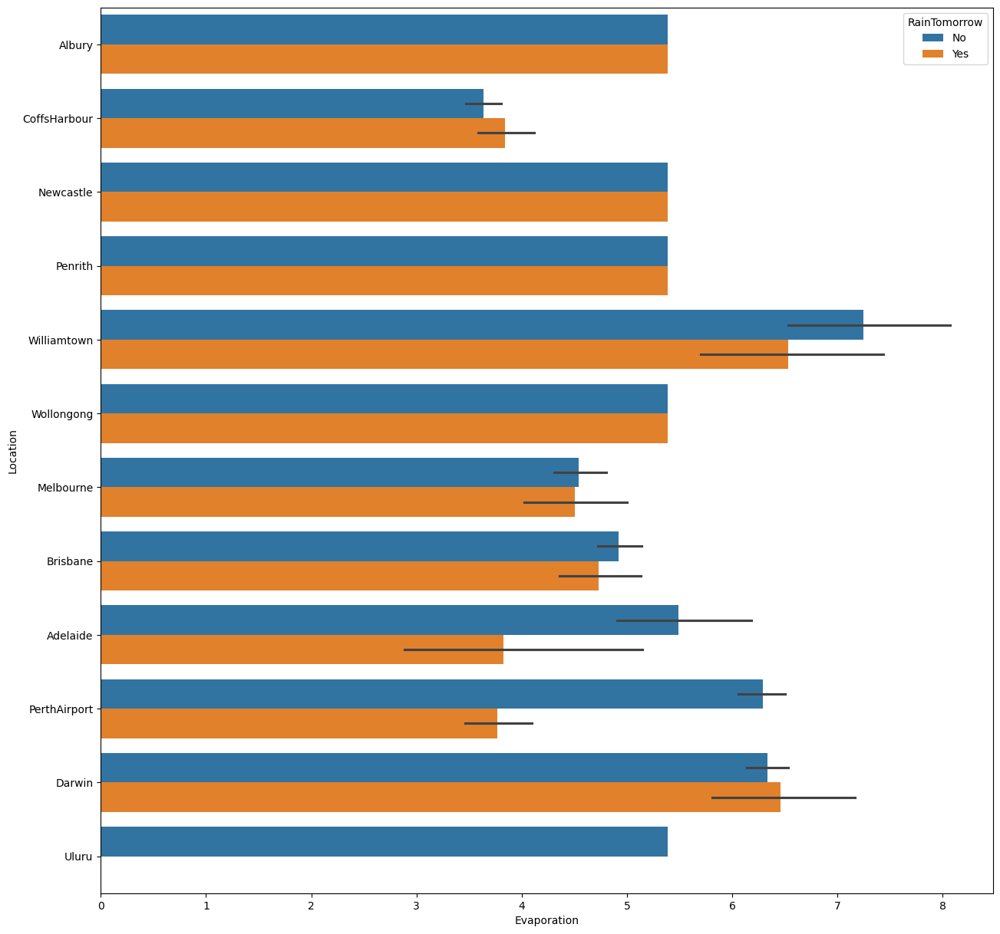

In [68]:
plt.figure(figsize=(15,15))
sns.barplot(rainfalldf,x='Evaporation',y='Location',hue='RainTomorrow',dodge=True)
plt.show()

It is clear from the above output from the barplot that the evaporation is higher for williamTown location implies the chance for rain for tomorrow is high for the willamTown location.

# Relationship between the columns Evaporation and rain tomorrow using categorical plot

<Figure size 1500x1500 with 0 Axes>

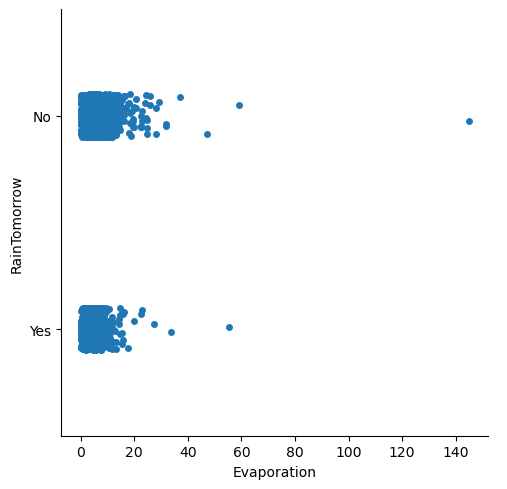

In [72]:
plt.figure(figsize=(15,15))
sns.catplot(rainfalldf,x='Evaporation',y='RainTomorrow')
plt.show()

In [74]:
rainfalldf["WindGustDir"].nunique()

16

# Univariate Analysis

# Countplot for the Location for weather station

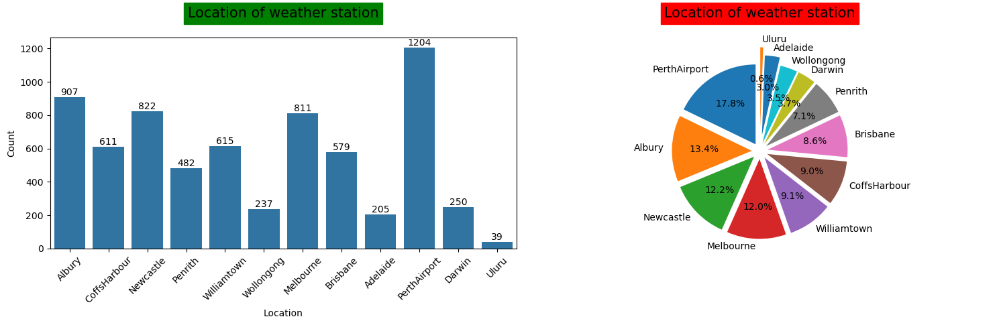

In [78]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
sns.countplot(x='Location',ax=ax1,data=rainfalldf)
for i in ax1.containers:
    ax1.bar_label(i)

ax1.set(xlabel="Location",ylabel="Count")
ax1.set_title("Location of weather station",fontsize=15,backgroundcolor='green',color='black',y=1.07)
ax1.tick_params(axis='x',rotation=45)
wind_count=rainfalldf["Location"].value_counts()

# Adjust the explode for 16 column values
explode=(0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.3)
ax2.pie(wind_count,labels=wind_count.index,autopct='%1.1f%%',explode=explode,startangle=90)
ax2.axis("equal")
ax2.set_title("Location of weather station",fontsize=15,backgroundcolor='red',color='black',y=1.07)
plt.tight_layout()
plt.show()

# Countplot for the direction of strongest Wind gust in 24 hours to midnight

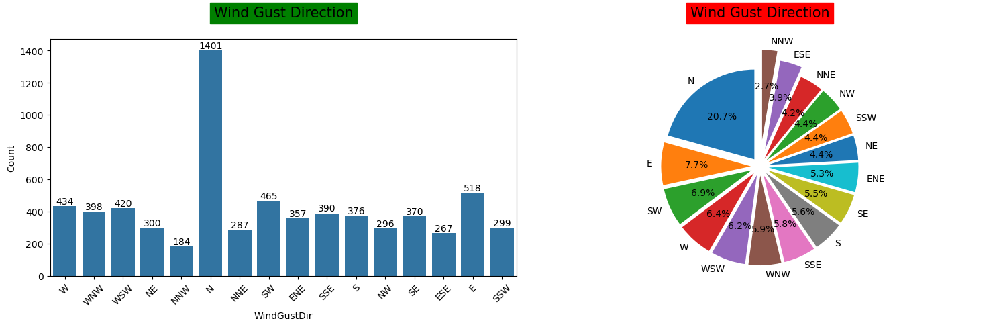

In [81]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
sns.countplot(x='WindGustDir',ax=ax1,data=rainfalldf)
for i in ax1.containers:
    ax1.bar_label(i)

ax1.set(xlabel="WindGustDir",ylabel="Count")
ax1.set_title("Wind Gust Direction",fontsize=15,backgroundcolor='green',color='black',y=1.07)
ax1.tick_params(axis='x',rotation=45)
wind_count=rainfalldf["WindGustDir"].value_counts()

# Adjust the explode for 16 column values
explode=(0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.3)
ax2.pie(wind_count,labels=wind_count.index,autopct='%1.1f%%',explode=explode,startangle=90)
ax2.axis("equal")
ax2.set_title("Wind Gust Direction",fontsize=15,backgroundcolor='red',color='black',y=1.07)
plt.tight_layout()
plt.show()

The output from above countplot shows that the North direction for the strongest windgust is higher value of 20.7 percent in 24 hours to midnight.

# Countplot to show the direction of wind at 9AM

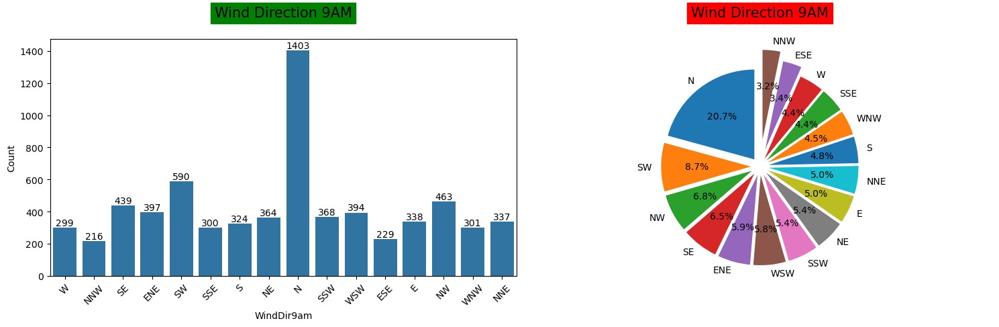

In [85]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
sns.countplot(x='WindDir9am',ax=ax1,data=rainfalldf)
for i in ax1.containers:
    ax1.bar_label(i)

ax1.set(xlabel="WindDir9am",ylabel="Count")
ax1.set_title("Wind Direction 9AM",fontsize=15,backgroundcolor='green',color='black',y=1.07)
ax1.tick_params(axis='x',rotation=45)
wind_count=rainfalldf["WindDir9am"].value_counts()

# Adjust the explode for 16 column values
explode=(0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.3)
ax2.pie(wind_count,labels=wind_count.index,autopct='%1.1f%%',explode=explode,startangle=90)
ax2.axis("equal")
ax2.set_title("Wind Direction 9AM",fontsize=15,backgroundcolor='red',color='black',y=1.07)
plt.tight_layout()
plt.show()

# Countplot to show the direction of wind at 3PM

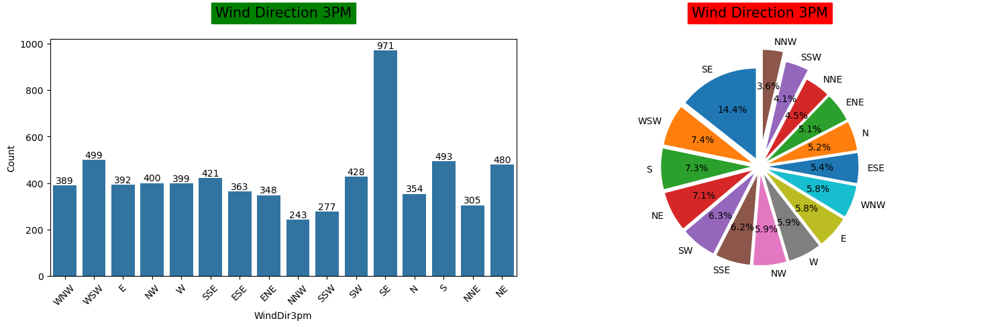

In [88]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
sns.countplot(x='WindDir3pm',ax=ax1,data=rainfalldf)
for i in ax1.containers:
    ax1.bar_label(i)

ax1.set(xlabel="WindDir3pm",ylabel="Count")
ax1.set_title("Wind Direction 3PM",fontsize=15,backgroundcolor='green',color='black',y=1.07)
ax1.tick_params(axis='x',rotation=45)
wind_count=rainfalldf["WindDir3pm"].value_counts()

# Adjust the explode for 16 column values
explode=(0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.3)
ax2.pie(wind_count,labels=wind_count.index,autopct='%1.1f%%',explode=explode,startangle=90)
ax2.axis("equal")
ax2.set_title("Wind Direction 3PM",fontsize=15,backgroundcolor='red',color='black',y=1.07)
plt.tight_layout()
plt.show()

# Bivariate Analysis

# Relationship between each column with the column RainTomorrow in the dataset

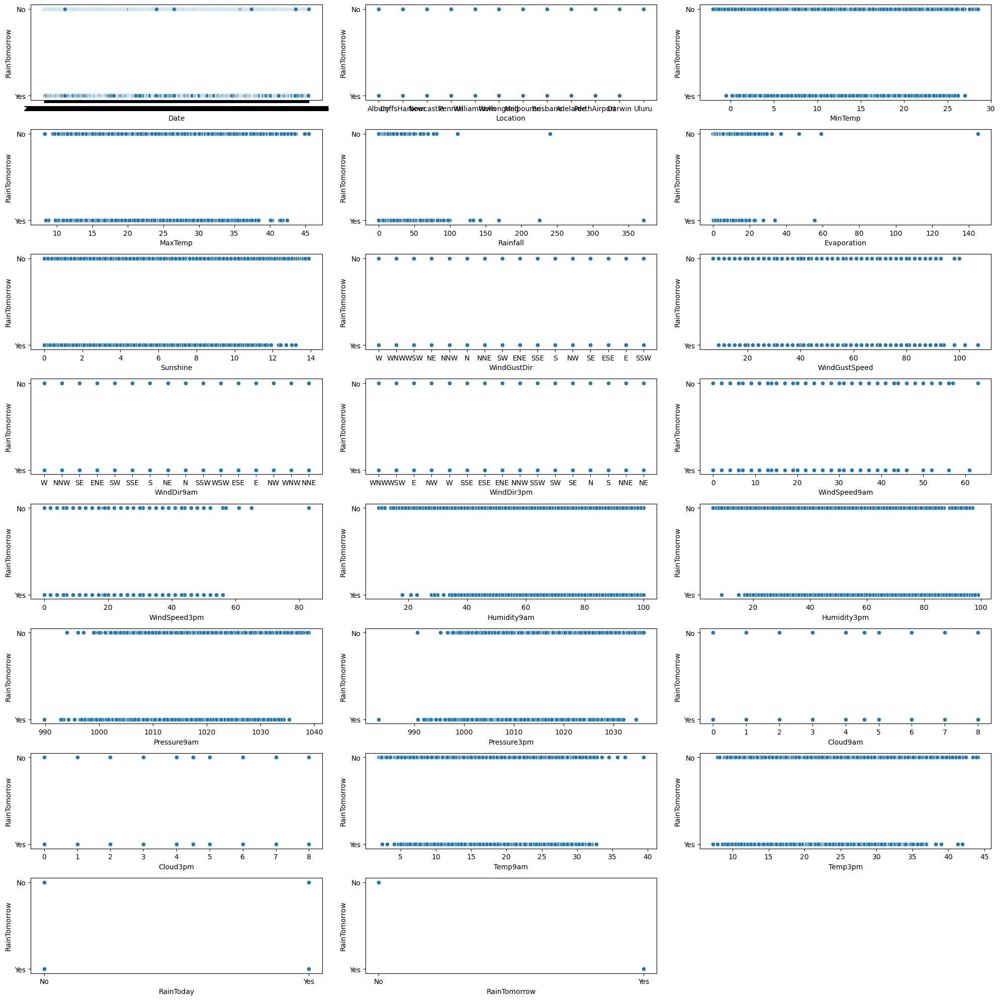

In [92]:
plt.figure(figsize=(20,20))
p=1
for i in rainfalldf:
    if p<=24:
        plt.subplot(8,3,p)
        sns.scatterplot(rainfalldf,x=i,y='RainTomorrow')
    p=p+1
plt.tight_layout()

# Countplot for the column RainToday

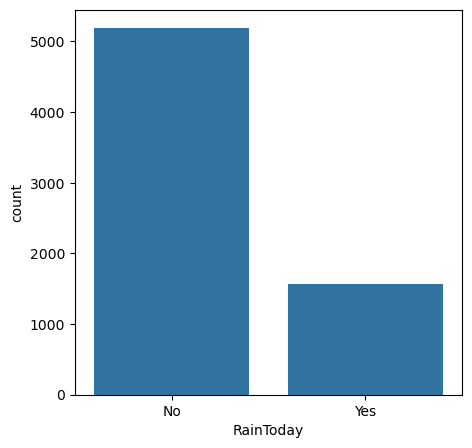

In [95]:
plt.figure(figsize=(5,5))
sns.countplot(rainfalldf,x='RainToday')
plt.show()

# Countplot for the column RainTomorrow

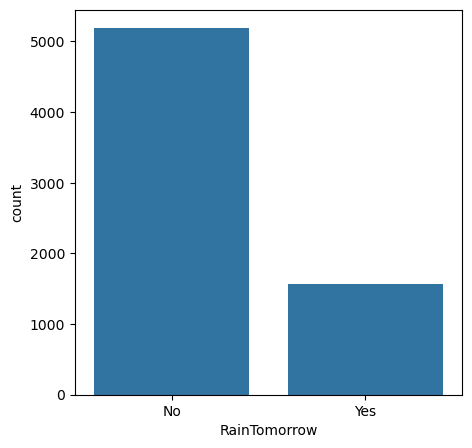

In [98]:
plt.figure(figsize=(5,5))
sns.countplot(rainfalldf,x='RainTomorrow')
plt.show()

# Label Encoder

In [101]:
columns_to_encode=['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']
le=LabelEncoder()
rainfalldf[columns_to_encode]=rainfalldf[columns_to_encode].apply(le.fit_transform)

In [103]:
rainfalldf['Date']=pd.to_datetime(rainfalldf['Date'])

In [105]:
rainfalldf.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,1,13.4,22.9,0.6,5.389395,7.632205,13,44.0,13,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
1,2008-12-02,1,7.4,25.1,0.0,5.389395,7.632205,14,44.0,6,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2,2008-12-03,1,12.9,25.7,0.0,5.389395,7.632205,15,46.0,13,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
3,2008-12-04,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,9,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
4,2008-12-05,1,17.5,32.3,1.0,5.389395,7.632205,13,41.0,1,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0


# Seaborn heatmap to show correlation in the dataset

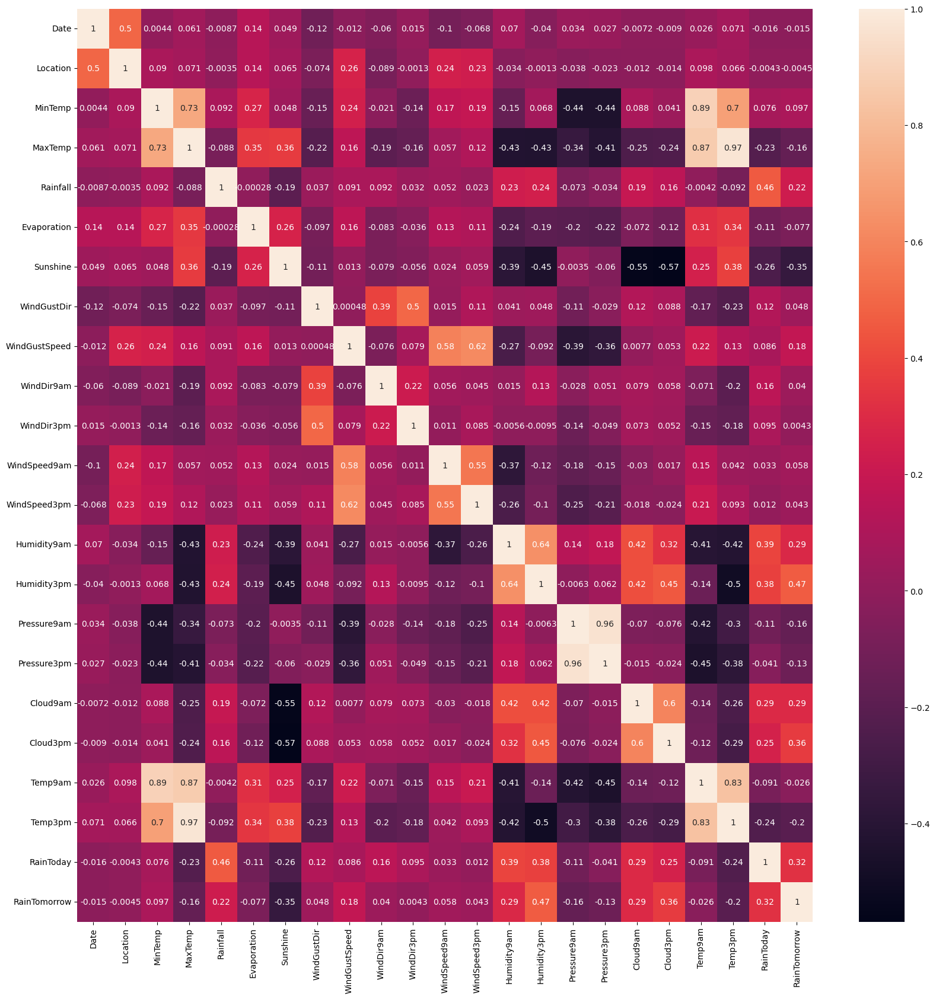

In [108]:
plt.figure(figsize=(20,20))
sns.heatmap(rainfalldf.corr(),annot=True)
plt.show()

The output from the above heatmap shows that:

1, The columns Temp9am and Temp3pm are positively correlated with each other.

2, The columns pressure9am and pressure3pm are positively correlated with each other.

3, The columns MinTemp and MaxTemp are positively correlated with each other.

4, The columns WindSpeed9am and WindSpeed3pm are positively correlated with each other.

5, The column Humidity3pm is positively correlated with the column RainTomorrow.

# Check for the skewness in the dataset using distplot

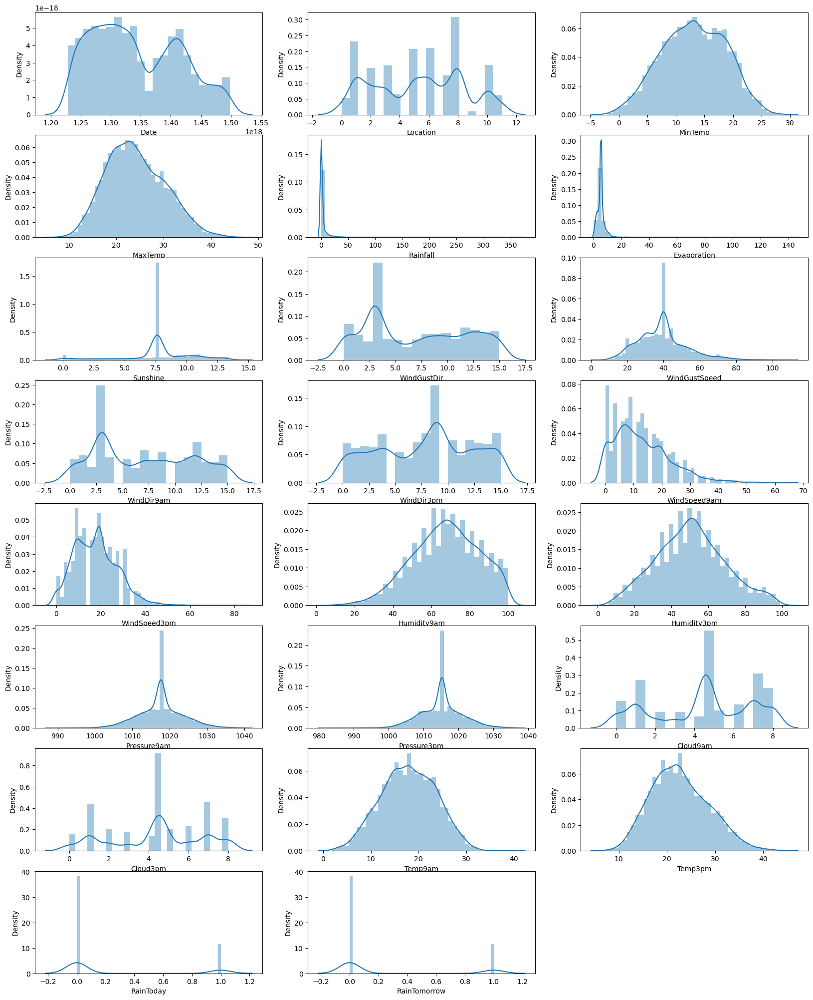

In [112]:
p=1
plt.figure(figsize=(20,25))
for i in rainfalldf:
    if p<=24:
        plt.subplot(8,3,p)
        sns.distplot(rainfalldf[i])
        plt.xlabel(i)
    p=p+1
plt.show()

In [114]:
rainfalldf=rainfalldf.drop(columns='Date',axis=1)

# Check for the skewness in the dataset using skew method

In [117]:
rainfalldf.skew()

Location         -0.000009
MinTemp          -0.084177
MaxTemp           0.328575
Rainfall         13.650141
Evaporation      13.516272
Sunshine         -0.743759
WindGustDir       0.181462
WindGustSpeed     0.742028
WindDir9am        0.220355
WindDir3pm       -0.123726
WindSpeed9am      0.953847
WindSpeed3pm      0.545217
Humidity9am      -0.256616
Humidity3pm       0.149053
Pressure9am       0.020745
Pressure3pm       0.031664
Cloud9am         -0.291165
Cloud3pm         -0.227885
Temp9am          -0.046686
Temp3pm           0.349901
RainToday         1.266937
RainTomorrow      1.266937
dtype: float64

# Remove the skewness in the dataset using pandas skew method

In [120]:
rainfalldf['Rainfall']=np.cbrt(rainfalldf['Rainfall'])
rainfalldf['Evaporation']=np.cbrt(rainfalldf['Evaporation'])
rainfalldf['WindSpeed9am']=np.cbrt(rainfalldf['WindSpeed9am'])
rainfalldf['RainToday']=np.cbrt(rainfalldf['RainToday'])
rainfalldf['RainTomorrow']=np.cbrt(rainfalldf['RainTomorrow'])

In [122]:
rainfalldf.skew()

Location        -0.000009
MinTemp         -0.084177
MaxTemp          0.328575
Rainfall         1.687550
Evaporation     -0.082048
Sunshine        -0.743759
WindGustDir      0.181462
WindGustSpeed    0.742028
WindDir9am       0.220355
WindDir3pm      -0.123726
WindSpeed9am    -1.123520
WindSpeed3pm     0.545217
Humidity9am     -0.256616
Humidity3pm      0.149053
Pressure9am      0.020745
Pressure3pm      0.031664
Cloud9am        -0.291165
Cloud3pm        -0.227885
Temp9am         -0.046686
Temp3pm          0.349901
RainToday        1.266937
RainTomorrow     1.266937
dtype: float64

# Skewness is removed from dataset

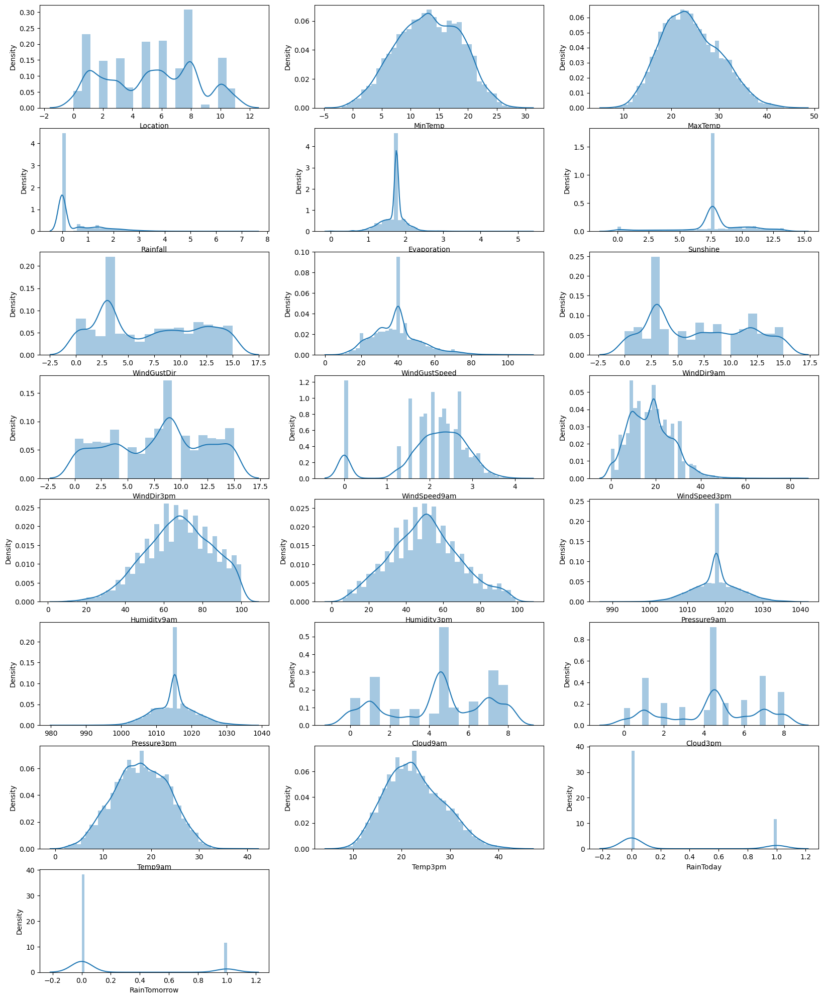

In [125]:
p=1
plt.figure(figsize=(20,25))
for i in rainfalldf:
    if p<=24:
        plt.subplot(8,3,p)
        sns.distplot(rainfalldf[i])
        plt.xlabel(i)
    p=p+1
plt.show()

# Check for the outliers present in the dataset using boxplot

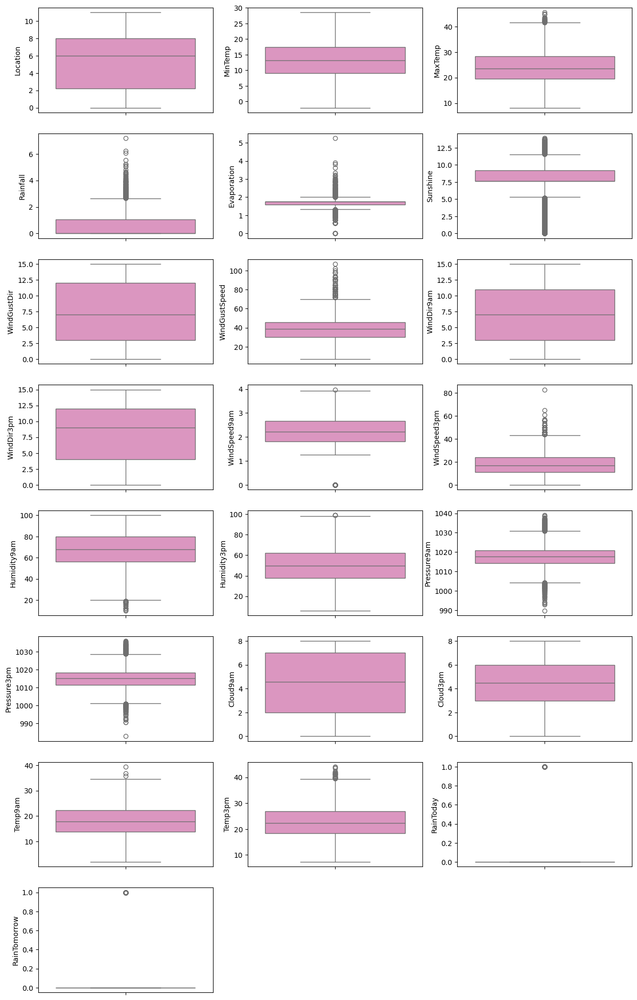

In [128]:
p=1
plt.figure(figsize=(15,25))
for i in rainfalldf:
    if p<=24:
        plt.subplot(8,3,p)
        sns.boxplot(rainfalldf[i],palette='Set2_r')
    p=p+1
plt.show()

# Detect and remove the outliers present in the dataset using zscore

In [131]:
z=np.abs(zscore(rainfalldf))
z

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.395097,0.052341,0.195170,0.312106,0.189319,0.049294,1.246744,0.362850,1.315650,1.372365,...,0.203179,1.539598,1.647292,1.347736,1.453517,0.056332,0.173722,0.151545,0.550355,0.550355
1,1.395097,1.030640,0.163738,0.624059,0.189319,0.049294,1.455523,0.362850,0.222688,1.595253,...,1.368283,1.377411,1.166162,1.230431,0.067188,0.056332,0.121292,0.267112,0.550355,0.550355
2,1.395097,0.037907,0.261622,0.624059,0.189319,0.049294,1.664301,0.512305,1.315650,1.595253,...,1.717496,1.107100,1.663883,1.079611,0.067188,1.020514,0.542811,0.082903,0.550355,0.550355
3,1.395097,0.705746,0.636844,0.624059,0.189319,0.049294,0.632264,1.131708,0.436600,1.748064,...,1.310080,1.863971,0.004812,0.392542,0.067188,0.056332,0.035995,0.635529,0.550355,0.550355
4,1.395097,0.792378,1.338345,0.485888,0.189319,0.049294,1.246744,0.138666,1.321500,0.187849,...,0.843405,0.944913,1.132980,1.532071,1.049737,1.560632,0.016434,1.171410,0.550355,0.550355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.186193,1.860925,0.113600,0.624059,0.189319,0.049294,1.467379,0.608613,0.436600,1.525176,...,0.960867,1.431473,1.156538,0.864293,0.067188,0.056332,1.362117,0.051067,0.550355,0.550355
8421,1.186193,1.716528,0.196366,0.624059,0.189319,0.049294,0.214707,1.281164,0.436600,1.079401,...,0.669855,1.593660,0.974040,0.663199,0.067188,0.056332,1.222306,0.300604,0.550355,0.550355
8422,1.186193,1.391634,0.457390,0.624059,0.189319,0.049294,0.841043,0.160246,0.436600,1.372365,...,0.844462,1.431473,0.559272,0.277770,0.067188,0.056332,0.942683,0.568544,0.550355,0.550355
8423,1.186193,0.958441,0.473704,0.624059,0.189319,0.049294,0.411629,0.832796,0.656363,1.079401,...,0.960867,1.431473,0.293821,0.227497,0.565382,1.020514,0.488297,0.551798,0.550355,0.550355


In [133]:
np.where(z>3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
         568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
         770,  795,  796,  797,  802,  928,  935,  949,  979,  980,  980,
        1008, 1008, 1009, 1011, 1138, 1148, 1149, 1151, 1189, 1203, 1237,
        1241, 1264, 1265, 1357, 1369, 1387, 1411, 1412, 1413, 1426, 1467,
        1479, 1480, 1480, 1481, 1513, 1587, 1644, 1661, 1665, 1673, 1680,
        1774, 1819, 1873, 1898, 2028, 2043, 2108, 2116, 2201, 2219, 2230,
        2231, 2265, 2429, 2488, 2500, 2505, 2527, 2527, 2541, 2593, 2676,
        2677, 2735, 2827, 2835, 2838, 2849, 2849, 2855, 2859, 2863, 2869,
        2877, 2883, 2890, 2891, 2897, 2898, 2900, 2900, 2901, 2905, 2909,
        2911, 2919, 2925, 2933, 2939, 2947, 2953, 2961, 2967, 2975, 2989,
        3003, 3051, 3051, 3055, 3058, 

In [135]:
rainfall_df=rainfalldf[(z<=3).all(axis=1)]

In [137]:
print("Percentage of data loss",((rainfalldf.shape[0]-rainfall_df.shape[0])/rainfalldf.shape[0])*100)

Percentage of data loss 4.895001478852411


In [139]:
rainfalldf.shape

(6762, 22)

In [141]:
rainfall_df.shape

(6431, 22)

# Seaborn pairplot for the relationship between each features in the dataset

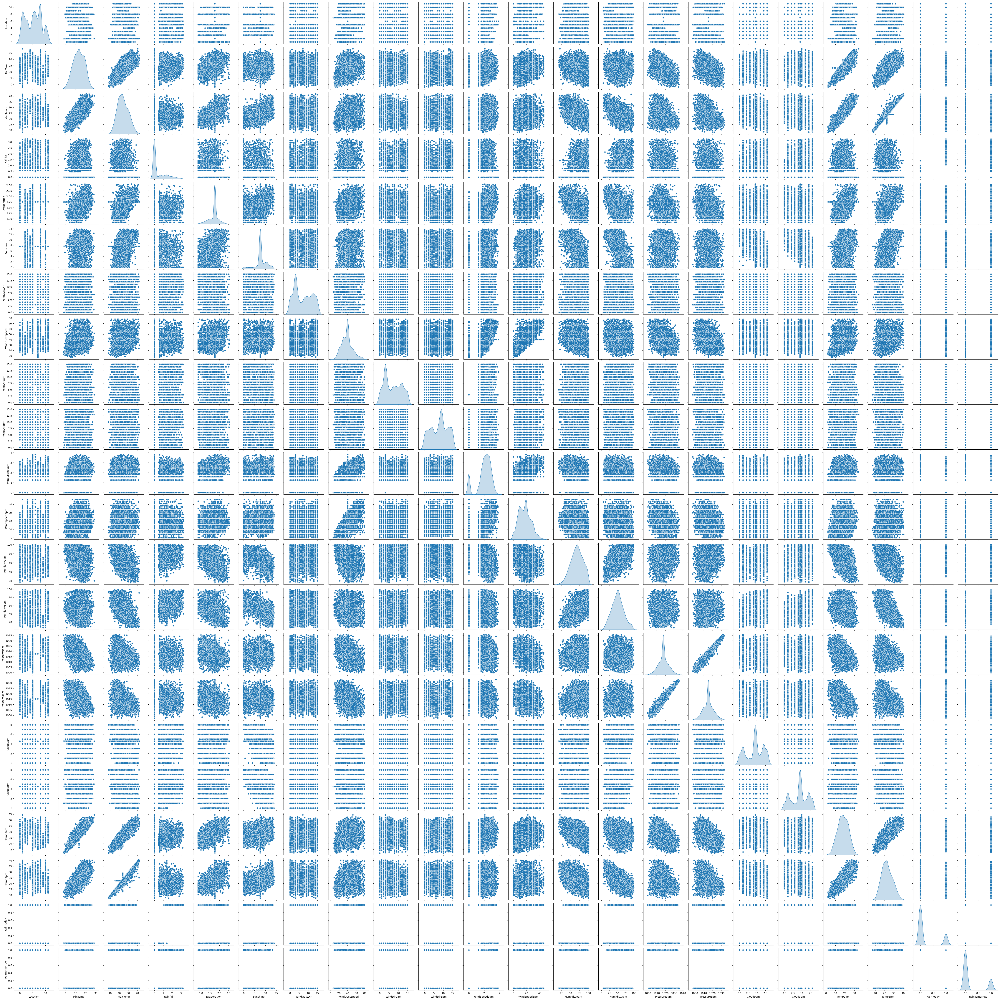

In [281]:
sns.pairplot(rainfall_df,diag_kind='kde');

# Classification Task

# Prediction of the target column Rain Tomorrow

# Split the dataset x(input) and y(label/target)

In [147]:
x=rainfall_df.drop(columns='RainTomorrow',axis=1)
y=rainfall_df['RainTomorrow']

# Feature selection using Chi2 test

H0---> Column is important for prediction (Null hypothesis is accepted)

H1---> Column is not important for prediction (Alternative hypothesis is accepted)

In [154]:
def Testindependent(colx,coly,alpha=0.05):
    x=rainfall_df[colx]
    y=rainfall_df[coly]
    dfobserved=pd.crosstab(y,x)
    chi2,p,dof,expected=chi2_contingency(dfobserved)
    dfexpected=pd.DataFrame(expected,columns=dfobserved.columns,index=dfobserved.index)
    if p < alpha:
        result="{0} is important for prediction".format(colx)
    else:
        result="{0} is not an important predictor.(Discard {0} from model)".format(colx)
    print(result)

In [156]:
features=['Location','MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm','WindGustDir','WindDir9am','WindDir3pm','RainToday']
for var in features:
    Testindependent(colx=var,coly='RainTomorrow',alpha=0.05)

Location is important for prediction
MinTemp is important for prediction
MaxTemp is important for prediction
Rainfall is important for prediction
Evaporation is important for prediction
Sunshine is important for prediction
WindGustSpeed is important for prediction
WindSpeed9am is important for prediction
WindSpeed3pm is important for prediction
Humidity9am is important for prediction
Humidity3pm is important for prediction
Pressure9am is important for prediction
Pressure3pm is important for prediction
Cloud9am is important for prediction
Cloud3pm is important for prediction
Temp9am is not an important predictor.(Discard Temp9am from model)
Temp3pm is important for prediction
WindGustDir is important for prediction
WindDir9am is important for prediction
WindDir3pm is important for prediction
RainToday is important for prediction


In [158]:
# Drop the column that is not important for prediction of target or label
x=x.drop(columns='Temp9am',axis=1)

# Check for the multicollinearity in the dataset using variance inflation factor

In [163]:
def calc_vif(x):
    df=pd.DataFrame()
    df['columns']=x.columns
    df['VIF']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return df

In [165]:
calc_vif(x)

,columns,VIF
0,Location,4.503184
1,MinTemp,35.151410
2,MaxTemp,430.666275
3,Rainfall,6.596893
4,Evaporation,62.956698
5,Sunshine,18.933240
6,WindGustDir,4.980593
7,WindGustSpeed,20.442599
8,WindDir9am,4.670677
9,WindDir3pm,5.898363


In [167]:
x=x.drop(columns='Pressure9am',axis=1)

In [169]:
calc_vif(x)

,columns,VIF
0,Location,4.486077
1,MinTemp,33.453980
2,MaxTemp,430.659946
3,Rainfall,6.570371
4,Evaporation,62.643148
5,Sunshine,18.892401
6,WindGustDir,4.946944
7,WindGustSpeed,20.420018
8,WindDir9am,4.584779
9,WindDir3pm,5.682566


In [171]:
x=x.drop(columns='MaxTemp',axis=1)

In [173]:
calc_vif(x)

,columns,VIF
0,Location,4.483310
1,MinTemp,33.221222
2,Rainfall,6.567072
3,Evaporation,62.506574
4,Sunshine,18.859226
5,WindGustDir,4.938490
6,WindGustSpeed,20.299353
7,WindDir9am,4.578476
8,WindDir3pm,5.675174
9,WindSpeed9am,11.391407


In [175]:
x=x.drop(columns='Pressure3pm',axis=1)

In [177]:
calc_vif(x)

,columns,VIF
0,Location,4.477365
1,MinTemp,24.846917
2,Rainfall,6.553119
3,Evaporation,54.141840
4,Sunshine,18.232338
5,WindGustDir,4.908377
6,WindGustSpeed,19.517134
7,WindDir9am,4.424637
8,WindDir3pm,5.619157
9,WindSpeed9am,10.169720


# Check the target/ label value_counts

In [180]:
y.value_counts()

RainTomorrow
0.0    4996
1.0    1435
Name: count, dtype: int64

# Apply SMOTE oversampling technique to balance the dataset

In [183]:
smt=SMOTE()
x_balanced,y_balanced=smt.fit_resample(x,y)

In [185]:
y_balanced.value_counts()

RainTomorrow
0.0    4996
1.0    4996
Name: count, dtype: int64

# Apply Standard Scaler technique to the dataset

In [188]:
sc=StandardScaler()
x_scales=sc.fit_transform(x_balanced)
x_scaled=pd.DataFrame(x_scales,columns=x_balanced.columns)
x_scaled.head()

,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday
0,-1.431508,0.000448,0.163121,0.305762,0.140772,1.330396,0.327394,1.364928,1.474519,0.763938,0.697392,0.027013,-1.757604,1.33263,-0.171050,-0.018986,-0.699756
1,-1.431508,-1.123939,-0.811098,0.305762,0.140772,1.550192,0.327394,-0.221139,1.708208,-0.542749,0.484865,-1.592286,-1.601880,-0.11200,-0.171050,0.418264,-0.699756
2,-1.431508,-0.093251,-0.811098,0.305762,0.140772,1.769989,0.483323,1.364928,1.708208,0.710586,0.909918,-1.952130,-1.342340,-0.11200,-1.288997,0.225874,-0.699756
3,-1.431508,-0.786623,-0.811098,0.305762,0.140772,-0.647776,-1.231896,0.458604,-1.797127,0.195314,-0.896557,-1.532311,-2.069052,-0.11200,-0.171050,0.803045,-0.699756
4,-1.431508,0.768779,0.343966,0.305762,0.140772,1.330396,0.093501,-1.354043,-0.161304,-0.165323,0.272339,0.686727,-1.186616,0.91187,1.390666,1.362726,-0.699756


# Define the models for classification task

In [191]:
lg=LogisticRegression()
dtc=DecisionTreeClassifier()
svc=SVC()
knn=KNeighborsClassifier()
gnb=GaussianNB()
rfc=RandomForestClassifier()
ada=AdaBoostClassifier()
gbc=GradientBoostingClassifier()
bag=BaggingClassifier()
extra=ExtraTreesClassifier()

models_dict=[("Logistic Regression",lg),
        ("DecisionTree Classifier",dtc),
        ("SupportVector Classifier",svc),
        ("KNeighbors Classifier",knn),
        ("Gaussian NB",gnb),
        ("RandomForest Classifier",rfc),
        ("AdaBoost Classifier",ada),
        ("GradientBoosting Classifier",gbc),
        ("Bagging Classifier",bag),
        ("ExtraTrees Classifier",extra)]

# Perform cross validation to avoid overfitting and to get best performing model

In [194]:
models=[lg,dtc,svc,knn,gnb,rfc,ada,gbc,bag,extra]

for i in models:
    cvs=cross_val_score(i,x_scaled,y_balanced,scoring='accuracy',cv=5,n_jobs=-1)
    print("Cross validation score for",i,"is",cvs,"and mean of the cross validation is",np.mean(cvs))

Cross validation score for LogisticRegression() is [0.68484242 0.67183592 0.66166166 0.77127127 0.83383383] and mean of the cross validation is 0.7246890211872703
Cross validation score for DecisionTreeClassifier() is [0.69184592 0.5977989  0.65965966 0.75275275 0.83033033] and mean of the cross validation is 0.7064775130307897
Cross validation score for SVC() is [0.71435718 0.55677839 0.69169169 0.80530531 0.85985986] and mean of the cross validation is 0.7255984849281497
Cross validation score for KNeighborsClassifier() is [0.71885943 0.56528264 0.7017017  0.77927928 0.82132132] and mean of the cross validation is 0.717288874667564
Cross validation score for GaussianNB() is [0.73386693 0.69884942 0.67167167 0.74824825 0.79279279] and mean of the cross validation is 0.7290858141783604
Cross validation score for RandomForestClassifier() is [0.72236118 0.58929465 0.67367367 0.7977978  0.92242242] and mean of the cross validation is 0.7411099443615702
Cross validation score for AdaBoostC

# Get the best random state and maximum accuracy score

In [355]:
maxrs=0
maxacc=0
for i in range(200):
    x_train,x_test,y_train,y_test=train_test_split(x_scaled,y_balanced,test_size=0.30,random_state=i)
    extra.fit(x_train,y_train)
    y_pred=extra.predict(x_test)
    acc=accuracy_score(y_test,y_pred)
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print("Accuarcy Score is",maxacc,"and random state is",maxrs)

Accuarcy Score is 0.9219479653102068 and random state is 195


In [197]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y_balanced,test_size=0.30,random_state=195)

In [199]:
x_train.shape

(6994, 17)

In [201]:
x_test.shape

(2998, 17)

In [203]:
y_train.shape

(6994,)

In [205]:
y_test.shape

(2998,)

# Build and train the models for classification task

In [208]:
model_list=[]
for model_name,model_data in models_dict:
    model_data.fit(x_train,y_train)
    y_pred=model_data.predict(x_test)
    r2=r2_score(y_test,y_pred)
    accuracy=accuracy_score(y_test,y_pred)
    precision=precision_score(y_test,y_pred)
    recall=recall_score(y_test,y_pred)
    model={"Model name":model_name,"R2_score":r2,"Accuracy Score":accuracy,"Precision Score":precision,"Recall Score":recall}
    model_list.append(model)
df=pd.DataFrame(model_list)
df=df.sort_values(by="Accuracy Score",ascending=False)
df

,Model name,R2_score,Accuracy Score,Precision Score,Recall Score
9,ExtraTrees Classifier,0.646355,0.911608,0.913158,0.912558
5,RandomForest Classifier,0.579629,0.894930,0.900931,0.890861
8,Bagging Classifier,0.483545,0.870914,0.887825,0.853386
7,GradientBoosting Classifier,0.455520,0.863909,0.883001,0.843524
6,AdaBoost Classifier,0.384791,0.846231,0.861528,0.830375
2,SupportVector Classifier,0.376784,0.844229,0.840439,0.855358
3,KNeighbors Classifier,0.358101,0.839560,0.801624,0.908613
1,DecisionTree Classifier,0.315396,0.828886,0.823492,0.843524
0,Logistic Regression,0.144579,0.786191,0.806834,0.760684
4,Gaussian NB,0.020469,0.755170,0.771192,0.735700


# Hyperparameter tuning for ExtraTreesClassifier

In [211]:
param_grids={"criterion":["gini", "entropy", "log_loss"],"max_features":["sqrt", "log2", None],"class_weight":["balanced", "balanced_subsample"]}

In [213]:
param_grids

{'criterion': ['gini', 'entropy', 'log_loss'],
 'max_features': ['sqrt', 'log2', None],
 'class_weight': ['balanced', 'balanced_subsample']}

In [215]:
gscv=GridSearchCV(extra,param_grids,scoring='accuracy',cv=5,n_jobs=-1)

In [381]:
gscv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(), n_jobs=-1,
             param_grid={'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_features': ['sqrt', 'log2', None]},
             scoring='accuracy')

In [383]:
gscv.best_params_

{'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_features': None}

In [385]:
extra1=ExtraTreesClassifier(criterion='gini',class_weight='balanced_subsample',max_features=None)
extra1.fit(x_train,y_train)
y_pred_extra=extra1.predict(x_test)
print("R2 Score",r2_score(y_test,y_pred_extra))
print("Accuracy Score",accuracy_score(y_test,y_pred_extra))
print("Precision Score",precision_score(y_test,y_pred_extra))
print("Recall Score",recall_score(y_test,y_pred_extra))

R2 Score 0.6503583102197759
Accuracy Score 0.9126084056037358
Precision Score 0.9090318388564003
Recall Score 0.9197896120973044


# Hyperparameter tuning for RandomForest Classifier

In [397]:
param_grids1={"criterion":["gini", "entropy", "log_loss"],"max_features":["sqrt", "log2", None],"class_weight":["balanced", "balanced_subsample"]}

In [399]:
param_grids1

{'criterion': ['gini', 'entropy', 'log_loss'],
 'max_features': ['sqrt', 'log2', None],
 'class_weight': ['balanced', 'balanced_subsample']}

In [401]:
gscv1=GridSearchCV(rfc,param_grids1,scoring='accuracy',n_jobs=-1,cv=5)

In [403]:
gscv1.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_features': ['sqrt', 'log2', None]},
             scoring='accuracy')

In [405]:
gscv1.best_params_

{'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'log2'}

In [407]:
rfc1=RandomForestClassifier(criterion='entropy',max_features='log2',class_weight='balanced')
rfc1.fit(x_train,y_train)
y_pred_rfc=rfc1.predict(x_test)
print("R2 Score",r2_score(y_test,y_pred_rfc))
print("Accuracy Score",accuracy_score(y_test,y_pred_rfc))
print("Precision Score",precision_score(y_test,y_pred_rfc))
print("Recall Score",recall_score(y_test,y_pred_rfc))

R2 Score 0.6316751664910616
Accuracy Score 0.9079386257505003
Precision Score 0.9087327642810243
Recall Score 0.9099276791584484


In [409]:
fpr,tpr,threshold=roc_curve(y_test,y_pred_extra)

In [411]:
fpr

array([0.        , 0.09478673, 1.        ])

In [413]:
tpr

array([0.        , 0.91978961, 1.        ])

In [415]:
threshold

array([inf,  1.,  0.])

# AUC-ROC curve

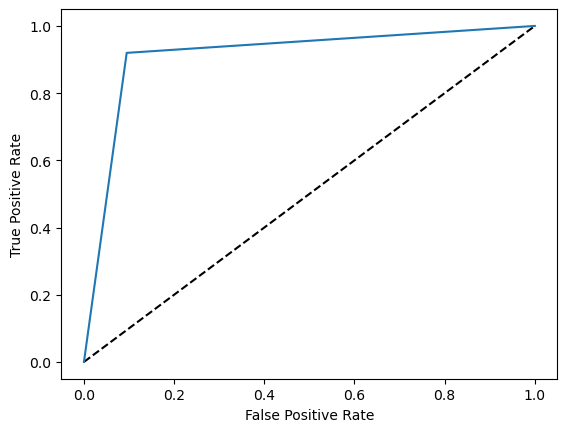

In [421]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label="Extra Trees Classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

In [423]:
auc_score=roc_auc_score(y_test,y_pred_extra)
auc_score

0.9125014411197423

# Save the best model

In [425]:
import joblib as jb

jb.dump(extra,open("Rainfall.obj","wb"))

# Load the model

In [431]:
import joblib as jb

model=jb.load(open("Rainfall.obj","rb"))
model.fit(x_train,y_train)
y_pred_extra1=model.predict(x_test)

# Create a dataframe for actual and predicted output

In [433]:
a=np.array(y_test)
df=pd.DataFrame()
df["Actual Output"]=a
df["Predicted Output"]=y_pred_extra1
df

,Actual Output,Predicted Output
0,0.0,0.0
1,1.0,1.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0
...,...,...
2993,1.0,1.0
2994,1.0,1.0
2995,1.0,1.0
2996,0.0,0.0


# Seaborn lineplot to show the relationship between actual output and predicted output

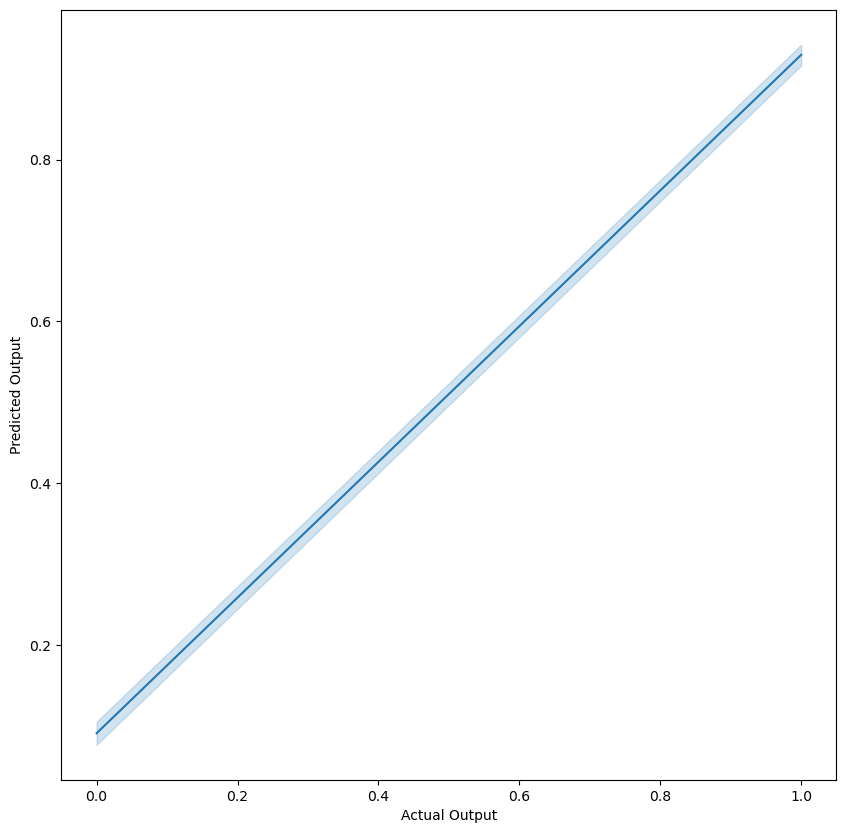

In [445]:
plt.figure(figsize=(10,10))
sns.lineplot(df,x=a,y=y_pred_extra1)
plt.xlabel("Actual Output")
plt.ylabel("Predicted Output")
plt.show()

The output from the lineplot shows the relationship between the actual output and predicted output. The increase in the value of actual output increases the value of predicted output shows that the ExtraTreeClassifier model perform well when compared to other classifier models.

# Regression Task

# Prediction of target column Rainfall

# Import the needed libraries for data preprocessing, model selection, model building and evaluation

In [153]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor,ExtraTreesRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [155]:
rainfall_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,0.843433,1.753261,7.632205,13,44.0,13,14,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1,7.4,25.1,0.000000,1.753261,7.632205,14,44.0,6,15,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,1,12.9,25.7,0.000000,1.753261,7.632205,15,46.0,13,15,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,1,9.2,28.0,0.000000,1.753261,7.632205,4,24.0,9,0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,1,17.5,32.3,1.000000,1.753261,7.632205,13,41.0,1,7,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0


# Split x(input) and y(target/label)

In [158]:
x=rainfall_df.drop(columns='Rainfall',axis=1)
y=rainfall_df['Rainfall']

# Check for the multicollinearity in the dataset using variance inflation factor

In [161]:
def calc_vif(x):
    df=pd.DataFrame()
    df['columns']=x.columns
    df['VIF']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return df  

In [163]:
calc_vif(x)

,columns,VIF
0,Location,4.527310
1,MinTemp,57.473772
2,MaxTemp,444.530898
3,Evaporation,63.410854
4,Sunshine,19.365370
5,WindGustDir,4.995847
6,WindGustSpeed,21.500673
7,WindDir9am,4.672566
8,WindDir3pm,5.896258
9,WindSpeed9am,11.549521


In [165]:
x=x.drop(columns=['Pressure9am','Pressure3pm','Temp3pm'],axis=1)

In [167]:
calc_vif(x)

,columns,VIF
0,Location,4.502163
1,MinTemp,44.726098
2,MaxTemp,142.247826
3,Evaporation,53.643151
4,Sunshine,18.808692
5,WindGustDir,4.923368
6,WindGustSpeed,20.340885
7,WindDir9am,4.452227
8,WindDir3pm,5.629304
9,WindSpeed9am,10.137657


In [169]:
x=x.drop(columns=['MaxTemp','Temp9am'],axis=1)

In [171]:
calc_vif(x)

,columns,VIF
0,Location,4.486130
1,MinTemp,8.832597
2,Evaporation,45.670305
3,Sunshine,16.893717
4,WindGustDir,4.910181
5,WindGustSpeed,20.080811
6,WindDir9am,4.411733
7,WindDir3pm,5.624130
8,WindSpeed9am,10.104160
9,WindSpeed3pm,8.513837


# Apply Standard Scaler technique to the dataset

In [167]:
sc=StandardScaler()
x_scales_reg=sc.fit_transform(x)
x_scaled_reg=pd.DataFrame(x_scales_reg,columns=x.columns)
x_scaled_reg.head()

,Location,MinTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,-1.395686,0.061930,0.220353,-0.074736,1.255316,0.442046,1.322373,1.377249,0.766741,0.735591,0.212722,-1.552499,1.470141,0.072840,-0.530888,-0.535938
1,-1.395686,-1.020843,0.220353,-0.074736,1.464027,0.442046,-0.217164,1.600518,-0.524870,0.517170,-1.380077,-1.387656,0.083112,0.072840,-0.530888,-0.535938
2,-1.395686,-0.028301,0.220353,-0.074736,1.672738,0.602407,1.322373,1.600518,0.714005,0.954013,-1.734032,-1.112917,0.083112,-1.006157,-0.530888,-0.535938
3,-1.395686,-0.696011,0.220353,-0.074736,-0.623082,-1.161560,0.442638,-1.748520,0.204678,-0.902569,-1.321084,-1.882186,0.083112,0.072840,-0.530888,-0.535938
4,-1.395686,0.801825,0.220353,-0.074736,1.255316,0.201505,-1.316832,-0.185635,-0.151798,0.298749,0.861639,-0.948073,1.066157,1.580143,-0.530888,-0.535938


# Define the Regression models

In [170]:
lr=LinearRegression()
ls=Lasso(alpha=0.0001)
rg=Ridge(alpha=0.0001)
dtr=DecisionTreeRegressor()
svr=SVR()
lsvr=LinearSVR()
knr=KNeighborsRegressor()
rfr=RandomForestRegressor()
adr=AdaBoostRegressor()
gbr=GradientBoostingRegressor()
bagr=BaggingRegressor()
etr=ExtraTreesRegressor()

models_dict1=[("LinearRegression",lr),
        ("Lasso",ls),
        ("Ridge",rg),
        ("DecisionTree Regressor",dtr),
        ("SupportVector Regressor",svr),
        ("KNeighbors Regressor",knr),
        ("RandomForest Regressor",rfr),
        ("AdaBoost Regressor",adr),
        ("GradientBoosting Regressor",gbr),
        ("Bagging Regressor",bagr),
        ("ExtraTrees Regressor",etr)]

# Perform cross validation to avoid overfitting and to get best performing model

In [173]:
models=[lr,ls,rg,dtr,svr,knr,rfr,adr,gbr,bagr,etr]

for i in models:
    cvs=cross_val_score(i,x_scaled_reg,y,cv=5,n_jobs=-1)
    print("Cross validation score for",i,"is",cvs,"and mean of the cross validation is",np.mean(cvs))

Cross validation score for LinearRegression() is [0.81273154 0.7705667  0.74975625 0.73045145 0.84666962] and mean of the cross validation is 0.7820351125427372
Cross validation score for Lasso(alpha=0.0001) is [0.81277606 0.77065971 0.74980066 0.73044698 0.84668529] and mean of the cross validation is 0.7820737397905925
Cross validation score for Ridge(alpha=0.0001) is [0.81273154 0.7705667  0.74975625 0.73045145 0.84666962] and mean of the cross validation is 0.7820351125630702
Cross validation score for DecisionTreeRegressor() is [0.56744578 0.43089268 0.45105099 0.56059262 0.58150563] and mean of the cross validation is 0.5182975399214368
Cross validation score for SVR() is [0.7825573  0.73234737 0.71528418 0.70774772 0.83859481] and mean of the cross validation is 0.7553062746980471
Cross validation score for KNeighborsRegressor() is [0.76955815 0.73504239 0.69448179 0.69344417 0.7978454 ] and mean of the cross validation is 0.7380743828276974
Cross validation score for RandomFore

# Get the best random state and maximum accuracy score

In [481]:
maxrs=0
maxacc=0
for i in range(200):
    x_train,x_test,y_train,y_test=train_test_split(x_scaled_reg,y,test_size=0.30,random_state=i)
    gbr.fit(x_train,y_train)
    y_pred=gbr.predict(x_test)
    acc=r2_score(y_test,y_pred)
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print("Accuarcy Score is",maxacc,"and random state is",maxrs)

Accuarcy Score is 0.8156160402026573 and random state is 104


In [176]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled_reg,y,test_size=0.30,random_state=104)

In [178]:
x_train.shape

(4501, 16)

In [180]:
x_test.shape

(1930, 16)

In [182]:
y_train.shape

(4501,)

In [184]:
y_test.shape

(1930,)

# Build and train the regression models

In [187]:
models_list=[]
for model_name,model_data in models_dict1:
    model_data.fit(x_train,y_train)
    y_pred=model_data.predict(x_test)
    r2=r2_score(y_test,y_pred)
    mse=mean_squared_error(y_test,y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    rmse=np.sqrt(mean_squared_error(y_test,y_pred))
    model1={"Model name":model_name,"R2_score":r2,"Mean Squared Error":mse,"Mean Absolute Error":mae,"Root Mean Squared Error":rmse}
    models_list.append(model1)
df1=pd.DataFrame(models_list)
df1

,Model name,R2_score,Mean Squared Error,Mean Absolute Error,Root Mean Squared Error
0,LinearRegression,0.808572,0.138148,0.262835,0.371682
1,Lasso,0.808563,0.138154,0.262836,0.371691
2,Ridge,0.808572,0.138148,0.262835,0.371682
3,DecisionTree Regressor,0.617570,0.275988,0.300767,0.525346
4,SupportVector Regressor,0.798252,0.145595,0.240909,0.381570
5,KNeighbors Regressor,0.783745,0.156064,0.255673,0.395050
6,RandomForest Regressor,0.811264,0.136205,0.252495,0.369059
7,AdaBoost Regressor,0.746905,0.182651,0.372424,0.427377
8,GradientBoosting Regressor,0.815604,0.133073,0.251654,0.364792
9,Bagging Regressor,0.798717,0.145260,0.254598,0.381130


In [192]:
gbr.fit(x_train,y_train)
y_pred_gbr1=gbr.predict(x_test)
print("R-Score",r2_score(y_test,y_pred_gbr1))
print("Mean Squared Error",mean_squared_error(y_test,y_pred_gbr1))
print("Mean Absolute Error",mean_absolute_error(y_test,y_pred_gbr1))
print("Root Mean Squared Error",np.sqrt(mean_squared_error(y_test,y_pred_gbr1)))

R-Score 0.815599844136619
Mean Squared Error 0.1330760269768666
Mean Absolute Error 0.2517135326779567
Root Mean Squared Error 0.3647958702848301


# Hyperparameter tuning for Gradient Boosting Regressor

In [194]:
grid_params={"loss" : ['squared_error', 'absolute_error', 'huber', 'quantile'],"criterion" : ['friedman_mse', 'squared_error'],"max_features" : ['sqrt', 'log2'],"alpha":[0.0,0.1,0.01,0.001,0.0001,0.00001,0.000001,1.0]}

In [196]:
grid_params

{'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'],
 'criterion': ['friedman_mse', 'squared_error'],
 'max_features': ['sqrt', 'log2'],
 'alpha': [0.0, 0.1, 0.01, 0.001, 0.0001, 1e-05, 1e-06, 1.0]}

In [198]:
gscv=GridSearchCV(gbr,grid_params,n_jobs=-1,cv=5)

In [200]:
gscv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'alpha': [0.0, 0.1, 0.01, 0.001, 0.0001, 1e-05, 1e-06,
                                   1.0],
                         'criterion': ['friedman_mse', 'squared_error'],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'max_features': ['sqrt', 'log2']})

In [202]:
gscv.best_params_

{'alpha': 0.1,
 'criterion': 'friedman_mse',
 'loss': 'squared_error',
 'max_features': 'sqrt'}

In [204]:
gbr1=GradientBoostingRegressor(loss="squared_error",criterion="friedman_mse",max_features="sqrt",alpha=0.1)
gbr1.fit(x_train,y_train)
y_pred_gbr=gbr1.predict(x_test)
print("R-Score",r2_score(y_test,y_pred_gbr))
print("Mean Squared Error",mean_squared_error(y_test,y_pred_gbr))
print("Mean Absolute Error",mean_absolute_error(y_test,y_pred_gbr))
print("Root Mean Squared Error",np.sqrt(mean_squared_error(y_test,y_pred_gbr)))

R-Score 0.8170430085100883
Mean Squared Error 0.1320345388056845
Mean Absolute Error 0.25022086138600924
Root Mean Squared Error 0.3633655718497344


# Hyperparameter tuning for Random Forest Regressor

In [198]:
param_grids1={"criterion":["squared_error", "absolute_error", "friedman_mse", "poisson"],"max_features":["sqrt", "log2", None]}

In [200]:
param_grids1

{'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
 'max_features': ['sqrt', 'log2', None]}

In [202]:
gscv1=GridSearchCV(rfr,param_grids1,n_jobs=-1,cv=5)

In [204]:
gscv1.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'criterion': ['squared_error', 'absolute_error',
                                       'friedman_mse', 'poisson'],
                         'max_features': ['sqrt', 'log2', None]})

In [206]:
gscv1.best_params_

{'criterion': 'squared_error', 'max_features': 'sqrt'}

In [208]:
rfr1=RandomForestRegressor(criterion="squared_error",max_features="sqrt")
rfr1.fit(x_train,y_train)
y_pred_rfr=rfr1.predict(x_test)
print("R-Score",r2_score(y_test,y_pred_rfr))
print("Mean Squared Error",mean_squared_error(y_test,y_pred_rfr))
print("Mean Absolute Error",mean_absolute_error(y_test,y_pred_rfr))
print("Root Mean Squared Error",np.sqrt(mean_squared_error(y_test,y_pred_rfr)))

R-Score 0.8136374385823832
Mean Squared Error 0.13449223583662756
Mean Absolute Error 0.25381808091362024
Root Mean Squared Error 0.36673183095639184


# Saving the best model

In [229]:
import pickle

pickle.dump(gbr,open("Rainfallweatherreg.pkl","wb"))

# Load the model

In [232]:
import pickle

model=pickle.load(open("Rainfallweatherreg.pkl","rb"))
model.predict(x_test)

array([0.11442691, 0.10096734, 0.14308806, ..., 0.25199421, 1.87022577,
       0.05779518])

# Create the dataframe for actual and predicted output

In [235]:
b=np.array(y_test)
df1=pd.DataFrame()
df1["Actual Output"]=b
df1["Predicted Output"]=y_pred_gbr1
df1

,Actual Output,Predicted Output
0,0.000000,0.114427
1,0.000000,0.100967
2,0.000000,0.143088
3,0.000000,0.105319
4,0.000000,0.263558
...,...,...
1925,0.000000,0.118187
1926,0.000000,0.154716
1927,0.584804,0.251994
1928,1.560491,1.870226


# Scatterplot to show the relationship between actual and predicted output

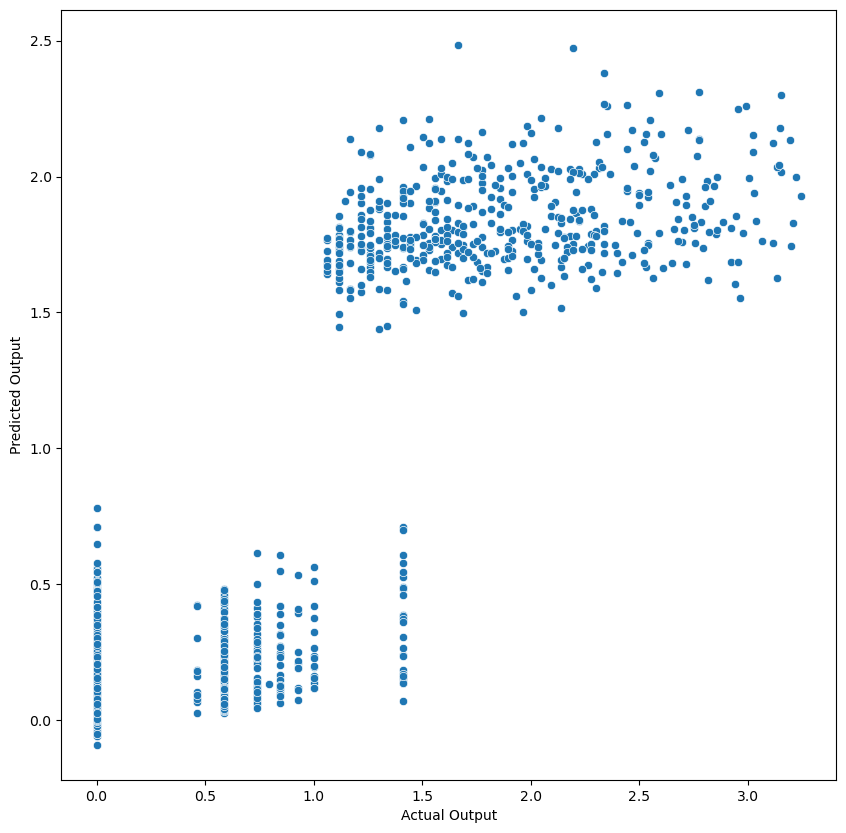

In [237]:
plt.figure(figsize=(10,10))
sns.scatterplot(df1,x=b,y=y_pred_gbr1)
plt.xlabel("Actual Output")
plt.ylabel("Predicted Output")
plt.show()